In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.dataset.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.roboflow.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/split.py
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00108_jpg.rf.3335d7cd1850cfa9d60d5bf7b48b5f33.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/10_00103_jpg.rf.1549154b51978d775abdb07b0bbf8ed7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/6_00054_jpg.rf.e55a6a8deba73ad5807c903e5299991d.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00088_jpg.rf.a4abd94687414d676ac4047fb693d2d7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/3_00149_jpg.rf.cf5567a5c4ca41e0ac97599663a260e9.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/11_00031_jpg.rf.fb6cad24e

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 16.6 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


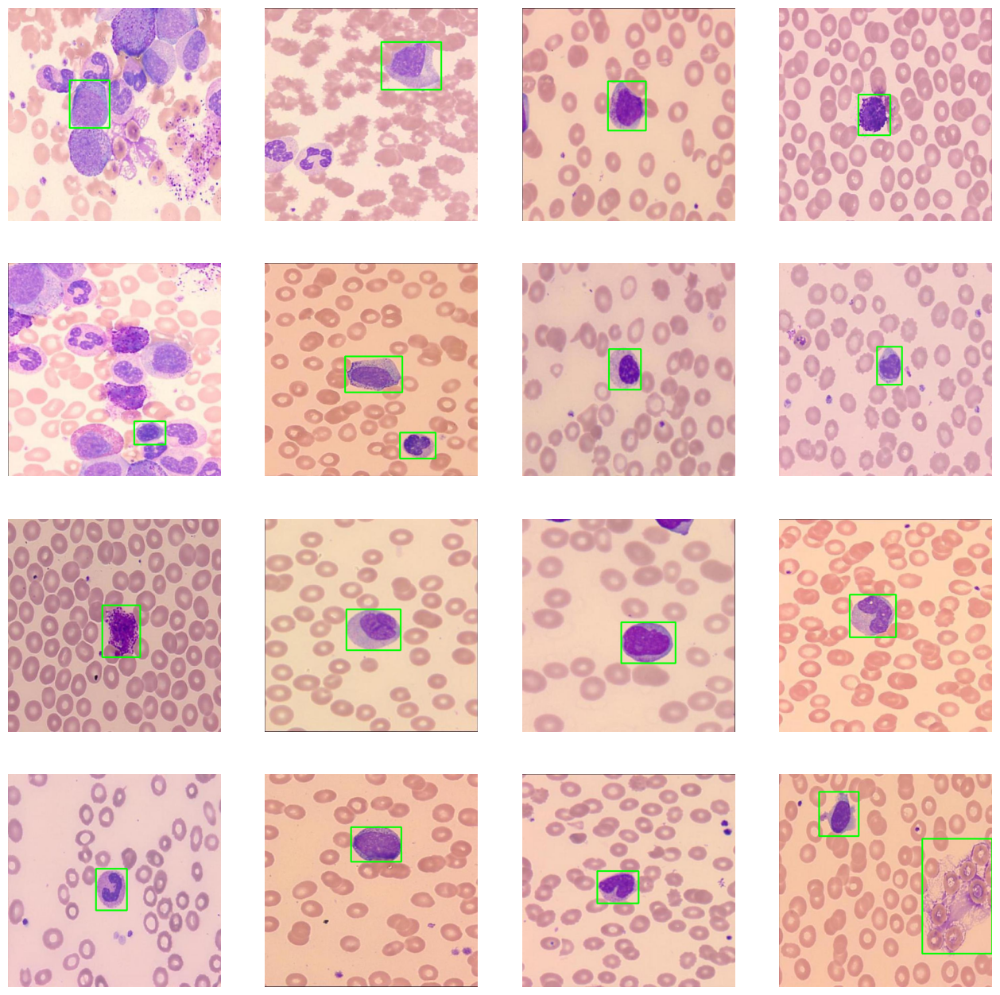

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images"
train_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels"

test_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images"
test_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels"

val_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/images"
val_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images/10_00001_jpg.rf.4fcbf927a55ca52647a1f9e5d1beb0b7.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolo11s.pt")

100%|██████████| 18.4M/18.4M [00:00<00:00, 168MB/s]


In [7]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml',  
    epochs=80,
    imgsz=640,                                  
    device='0'                       
)


Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=

100%|██████████| 755k/755k [00:00<00:00, 15.2MB/s]
2024-10-11 11:57:43,893	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-11 11:57:44,483	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytic

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 65.7MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels... 5803 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5803/5803 [00:15<00:00, 373.10it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels... 717 images, 0 backgrounds, 0 corrupt: 100%|██████████| 717/717 [00:01<00:00, 383.69it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      4.38G       0.76      3.016       1.04         16        640: 100%|██████████| 363/363 [01:42<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]


                   all        717        809      0.532      0.733      0.651      0.554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      4.35G     0.7351      1.432      1.017         20        640: 100%|██████████| 363/363 [01:40<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.64it/s]

                   all        717        809      0.512      0.638       0.57      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      4.35G     0.7555      1.349      1.032         26        640: 100%|██████████| 363/363 [01:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.69it/s]

                   all        717        809      0.511      0.715      0.663      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      4.35G     0.7297      1.256      1.022         11        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809      0.584      0.683      0.676      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      4.36G     0.7235      1.202      1.019         20        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.66it/s]

                   all        717        809      0.613      0.736      0.716       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      4.36G     0.6971      1.129      1.003         19        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.69it/s]

                   all        717        809      0.662      0.747      0.757      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      4.35G     0.6941      1.077     0.9991         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.606      0.783      0.728      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      4.35G     0.6766      1.043     0.9924         18        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.66it/s]

                   all        717        809      0.632      0.749      0.736      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      4.35G     0.6667      1.015     0.9887         23        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]

                   all        717        809      0.713      0.729      0.782      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      4.33G     0.6608     0.9777     0.9776         26        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.747      0.776      0.825      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      4.35G     0.6592     0.9672     0.9874         14        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]

                   all        717        809      0.744      0.731       0.79      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      4.35G     0.6471     0.9276     0.9786         14        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.79it/s]

                   all        717        809      0.713      0.807      0.809      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      4.35G     0.6374     0.9174     0.9717         24        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.74it/s]

                   all        717        809        0.7      0.777      0.778      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      4.33G      0.637     0.9047     0.9714         20        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.74it/s]

                   all        717        809      0.734      0.762      0.808      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      4.34G     0.6429     0.8809     0.9724         21        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.69it/s]

                   all        717        809      0.751      0.793      0.843      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      4.34G     0.6316     0.8705     0.9738         16        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.76it/s]

                   all        717        809      0.765      0.785       0.84      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      4.35G     0.6316     0.8429     0.9712         14        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.766      0.829      0.873      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      4.32G     0.6271     0.8278     0.9651         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.68it/s]

                   all        717        809      0.852       0.82      0.886      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      4.34G     0.6188     0.8169     0.9647         26        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.69it/s]

                   all        717        809      0.778       0.84      0.862      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      4.35G     0.6162     0.8045     0.9615         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.74it/s]

                   all        717        809      0.779      0.829       0.87      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      4.35G     0.6121     0.7879       0.96         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]

                   all        717        809      0.806      0.842      0.884      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      4.33G     0.5983     0.7705     0.9547         23        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.814      0.841      0.896      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      4.35G      0.609     0.7445     0.9566         14        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809      0.838      0.834      0.901      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      4.35G      0.606     0.7494     0.9572         26        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809       0.83      0.842      0.902      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      4.35G     0.6052     0.7508     0.9556         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.795      0.869      0.905      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      4.33G     0.5968     0.7234     0.9518         12        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.839      0.826        0.9      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      4.34G     0.6006     0.7237     0.9532         21        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809      0.797      0.874      0.904      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      4.34G     0.5909     0.7036     0.9521         20        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.829      0.874      0.918      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      4.35G     0.5937     0.7112     0.9517         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.833      0.879      0.921       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      4.32G     0.5832     0.6836     0.9452         23        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.76it/s]

                   all        717        809      0.836      0.859      0.915      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      4.34G     0.5883     0.6589     0.9501         24        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.849      0.891      0.934      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      4.35G       0.58     0.6538     0.9446         17        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.858      0.899      0.928      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      4.35G      0.581     0.6552     0.9444         21        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.79it/s]

                   all        717        809      0.861       0.87      0.926      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      4.33G     0.5741     0.6502     0.9419         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.845      0.885      0.926       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      4.35G     0.5748     0.6352     0.9445         28        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.837      0.886      0.934      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      4.35G     0.5779     0.6149     0.9448         20        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.66it/s]

                   all        717        809      0.891      0.866      0.934      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      4.35G     0.5725     0.6272     0.9396         18        640: 100%|██████████| 363/363 [01:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809      0.848      0.862      0.916      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80      4.33G      0.565     0.5996     0.9376         19        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.76it/s]

                   all        717        809      0.895      0.901      0.945       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      4.36G     0.5642     0.5945     0.9371         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.891      0.903      0.951      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      4.34G     0.5646     0.5859     0.9407         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.67it/s]

                   all        717        809        0.9      0.887       0.95      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      4.35G      0.563     0.5868     0.9375         28        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.80it/s]

                   all        717        809       0.91      0.908      0.958      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      4.33G     0.5587     0.5627     0.9333         24        640: 100%|██████████| 363/363 [01:37<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.895      0.889      0.948      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      4.35G     0.5537     0.5515     0.9308         20        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.66it/s]

                   all        717        809      0.907      0.917      0.958      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      4.36G     0.5498      0.552     0.9278         17        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809      0.884      0.892      0.945      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      4.35G     0.5551      0.545     0.9333         14        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.886      0.898      0.951      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      4.33G     0.5474     0.5238     0.9287         25        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.67it/s]

                   all        717        809      0.896       0.93      0.958      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      4.35G     0.5409     0.5177     0.9244         14        640: 100%|██████████| 363/363 [01:37<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.897      0.931      0.957      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      4.33G     0.5436     0.5141     0.9296         21        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.893      0.923       0.96      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80      4.35G     0.5495     0.5113     0.9331         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.81it/s]

                   all        717        809      0.911      0.944      0.969      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      4.33G     0.5396     0.4998     0.9251         20        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.918      0.921      0.963      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      4.35G     0.5385     0.4994     0.9259         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.81it/s]

                   all        717        809       0.93      0.925      0.968      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      4.34G     0.5376     0.4812     0.9276         27        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.944      0.899       0.97      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80      4.35G     0.5296     0.4718     0.9251         24        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.79it/s]

                   all        717        809      0.926      0.926      0.969      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      4.32G     0.5324     0.4636     0.9234         19        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.929      0.924      0.967      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      4.34G     0.5317     0.4622     0.9244         22        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.935      0.927      0.968      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      4.34G     0.5281     0.4532     0.9243         17        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]

                   all        717        809      0.924      0.936      0.973      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      4.36G     0.5262     0.4517     0.9198         19        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.74it/s]

                   all        717        809      0.959      0.921      0.976      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      4.33G     0.5128     0.4378     0.9159         23        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.74it/s]

                   all        717        809      0.939      0.927      0.975       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      4.35G     0.5205     0.4369     0.9185         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.74it/s]

                   all        717        809      0.944      0.924      0.975      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      4.35G     0.5079     0.4198     0.9151         21        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.79it/s]

                   all        717        809      0.941      0.923      0.971      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      4.35G     0.5107     0.4269     0.9148         28        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.81it/s]

                   all        717        809      0.939      0.939      0.974      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      4.33G     0.5095     0.4203     0.9137         15        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.948      0.953      0.979      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      4.35G     0.5069     0.4038     0.9099         14        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.80it/s]

                   all        717        809      0.953      0.938      0.978      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      4.35G     0.5045     0.3923     0.9119         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.952      0.945      0.978      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      4.35G     0.5003     0.3934     0.9095         23        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]

                   all        717        809      0.944      0.963      0.981      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      4.33G     0.5021     0.3989     0.9117         24        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.957      0.951       0.98      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80      4.34G     0.4964     0.3858       0.91         21        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.75it/s]

                   all        717        809      0.943      0.961      0.981      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      4.34G      0.495     0.3823     0.9142         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.957      0.951      0.982      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      4.35G     0.4927     0.3774     0.9045         23        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.953      0.954      0.982        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      4.32G     0.4897     0.3733     0.9067         22        640: 100%|██████████| 363/363 [01:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.80it/s]

                   all        717        809      0.967      0.951      0.983      0.902


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      4.33G     0.4309     0.2717     0.8646         13        640: 100%|██████████| 363/363 [01:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.76it/s]

                   all        717        809      0.961      0.948      0.984      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      4.33G     0.4211     0.2461     0.8559         11        640: 100%|██████████| 363/363 [01:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.72it/s]

                   all        717        809      0.962      0.951      0.985      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      4.34G     0.4192     0.2419     0.8583         11        640: 100%|██████████| 363/363 [01:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]

                   all        717        809      0.959      0.968      0.986      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      4.31G     0.4142     0.2338     0.8536         13        640: 100%|██████████| 363/363 [01:37<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.78it/s]

                   all        717        809      0.972      0.955      0.985      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      4.33G     0.4109     0.2292      0.853         11        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.76it/s]

                   all        717        809      0.974      0.953      0.986      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      4.35G     0.4077     0.2267     0.8526         11        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.73it/s]

                   all        717        809      0.977      0.952      0.985      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      4.34G     0.4051      0.223     0.8516         13        640: 100%|██████████| 363/363 [01:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.974      0.961      0.986      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      4.32G      0.404     0.2195     0.8503         11        640: 100%|██████████| 363/363 [01:37<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.76it/s]

                   all        717        809      0.972      0.962      0.986       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      4.34G     0.3982     0.2177     0.8473         11        640: 100%|██████████| 363/363 [01:37<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.968      0.962      0.985       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80      4.34G     0.3979     0.2143     0.8495         12        640: 100%|██████████| 363/363 [01:37<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]

                   all        717        809      0.976       0.96      0.985      0.911



80 epochs completed in 2.347 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 238 layers, 9,417,444 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]


                   all        717        809      0.974      0.961      0.986       0.91
   Atypical lymphocyte         62         72      0.956      0.906      0.984      0.858
       Band Neutrophil         63         73      0.946      0.954      0.969      0.898
              Basophil         72         73      0.998          1      0.995      0.923
                 Blast         28         63       0.97      0.921       0.99      0.929
            Eosinophil         58         59      0.997      0.983       0.99      0.901
            Lymphocyte         68         69      0.976      0.971      0.992       0.93
         Metamyelocyte         67         68      0.954      0.956      0.985      0.927
              Monocyte         55         57      0.965      0.979      0.978       0.92
             Myelocyte         56         62      0.995      0.935      0.984      0.874
                   NRC         53         58      0.969          1       0.99      0.922
          Promyelocyt

lr/pg0,▃▆███▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▁▁
lr/pg1,▆████▇▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁
lr/pg2,▃████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▁▁▁
metrics/mAP50(B),▁▁▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇████████████████████
metrics/mAP50-95(B),▁▁▁▃▃▅▅▅▅▆▆▆▆▆▆▇▆▆▇▆▇▇▇▇▇▇▇█████████████
metrics/precision(B),▁▁▂▄▄▃▄▄▆▄▆▅▅▅▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇█▇████████
metrics/recall(B),▁▁▂▂▃▁▁▄▃▄▄▄▅▅▅▆▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,██▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▄▄▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▂▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cd9262cb760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

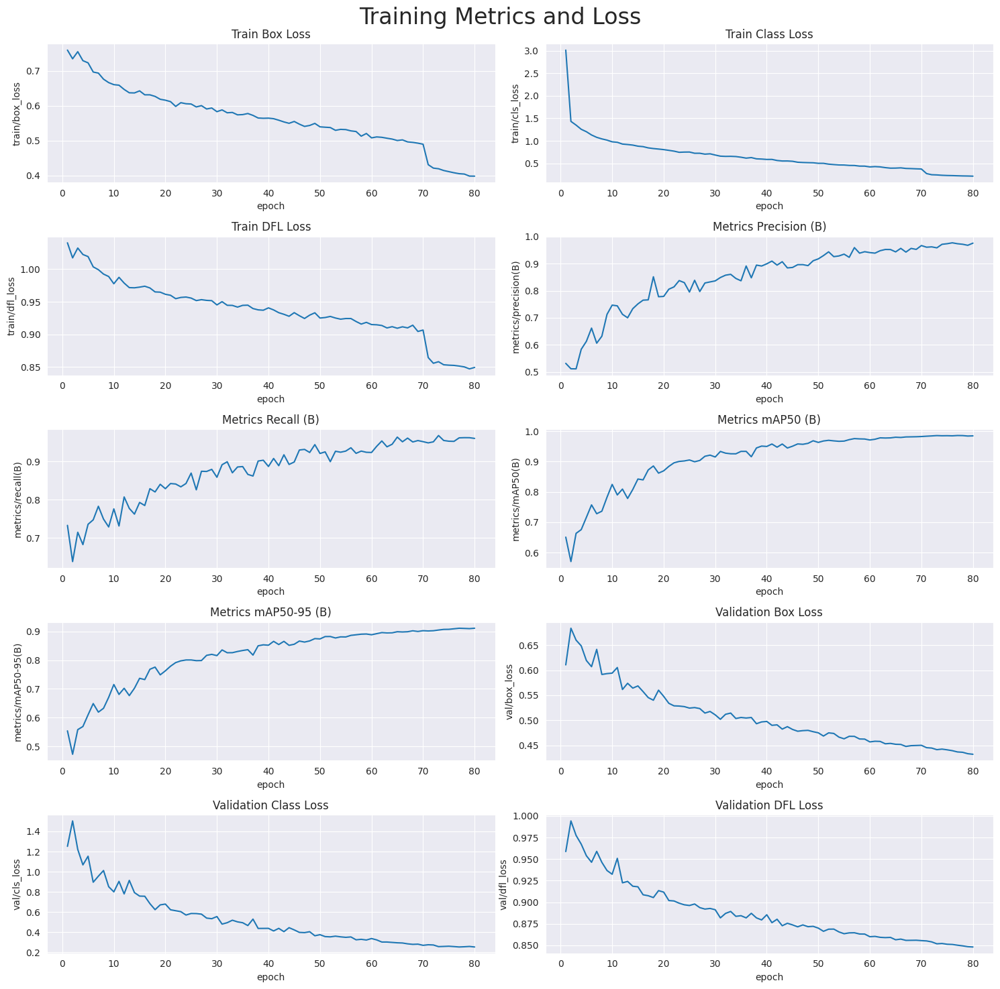

In [8]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [23]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 238 layers, 9,417,444 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels... 667 images, 0 backgrounds, 0 corrupt: 100%|██████████| 667/667 [00:00<00:00, 821.72it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test is not writeable, cache not saved.


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:08<00:00,  4.69it/s]


                   all        667        817      0.795      0.835      0.845      0.764
   Atypical lymphocyte         98        105      0.926      0.829      0.897      0.767
       Band Neutrophil         80         99      0.899      0.808      0.865      0.801
              Basophil         90         99      0.978      0.909      0.953      0.858
                 Blast         54        121      0.955      0.876      0.932      0.871
         Metamyelocyte         86         87      0.787      0.851      0.816      0.752
             Myelocyte         82        100      0.737       0.73      0.732       0.62
                   NRC         87         91      0.863      0.901       0.91        0.8
          Promyelocyte         73         92      0.715      0.957      0.909      0.844
  Segmented neutrophil         20         23      0.294      0.652      0.593       0.56
Speed: 0.3ms preprocess, 8.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect

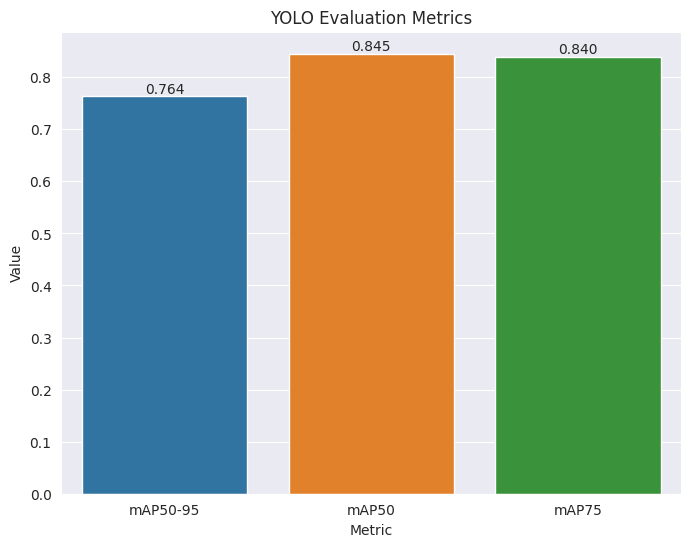

In [10]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

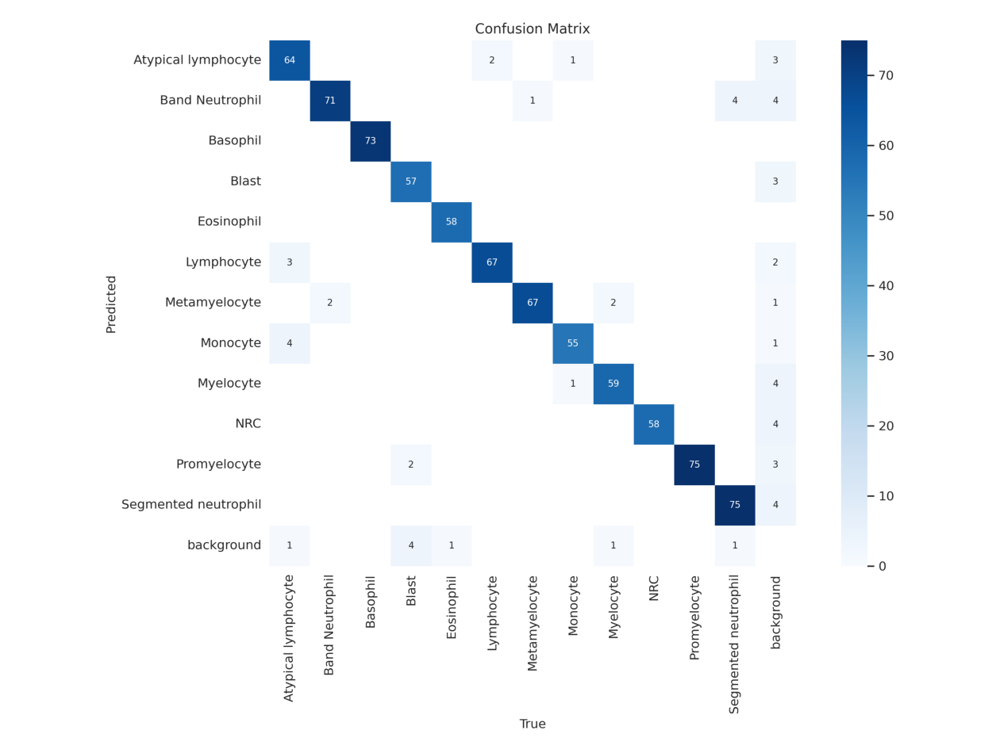

In [11]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

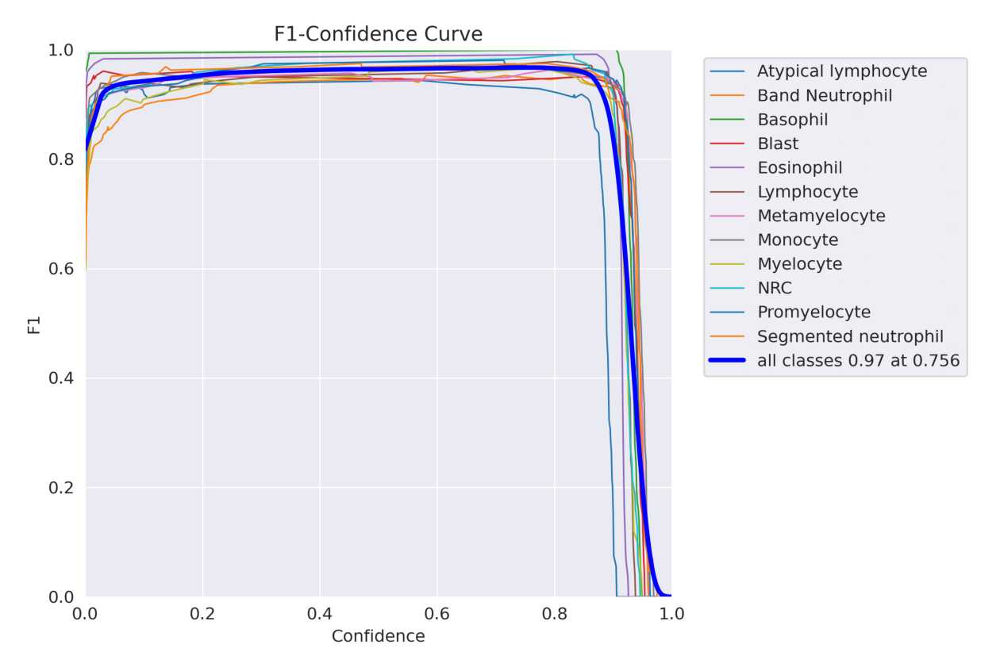

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

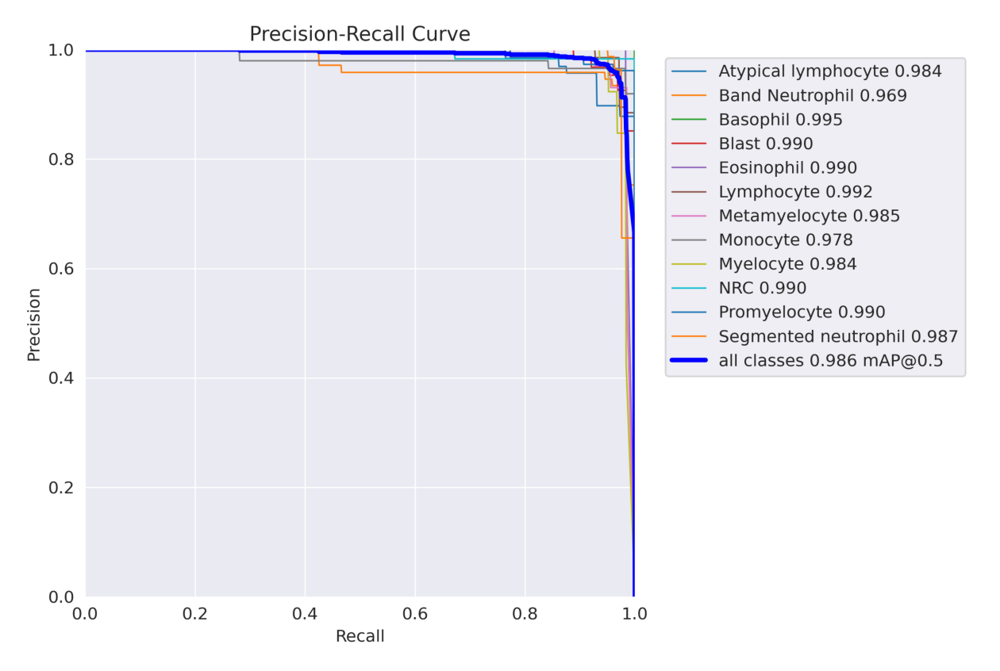

In [13]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

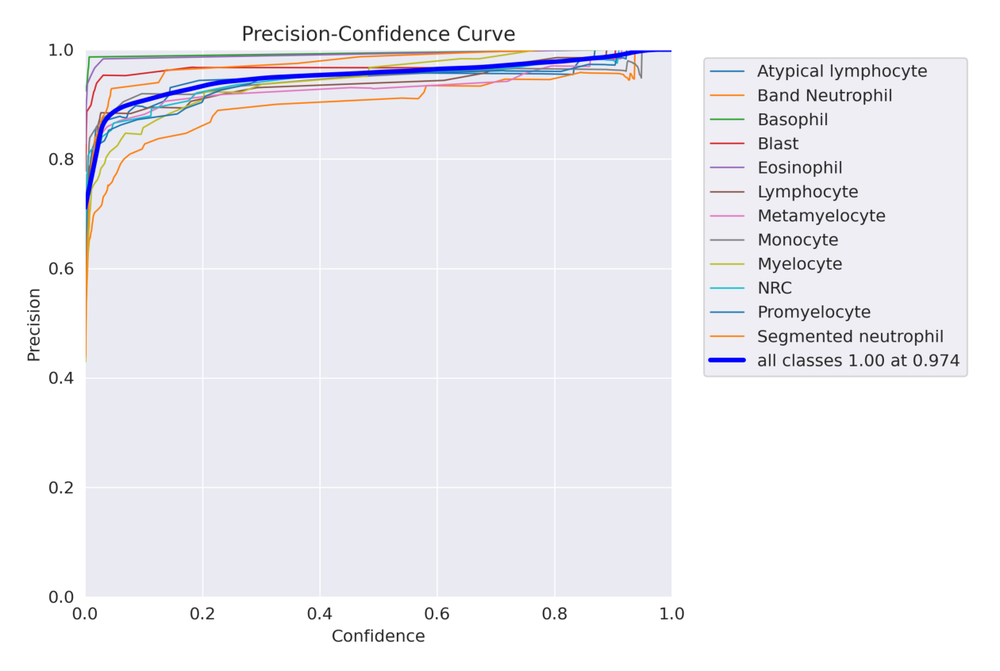

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/P_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

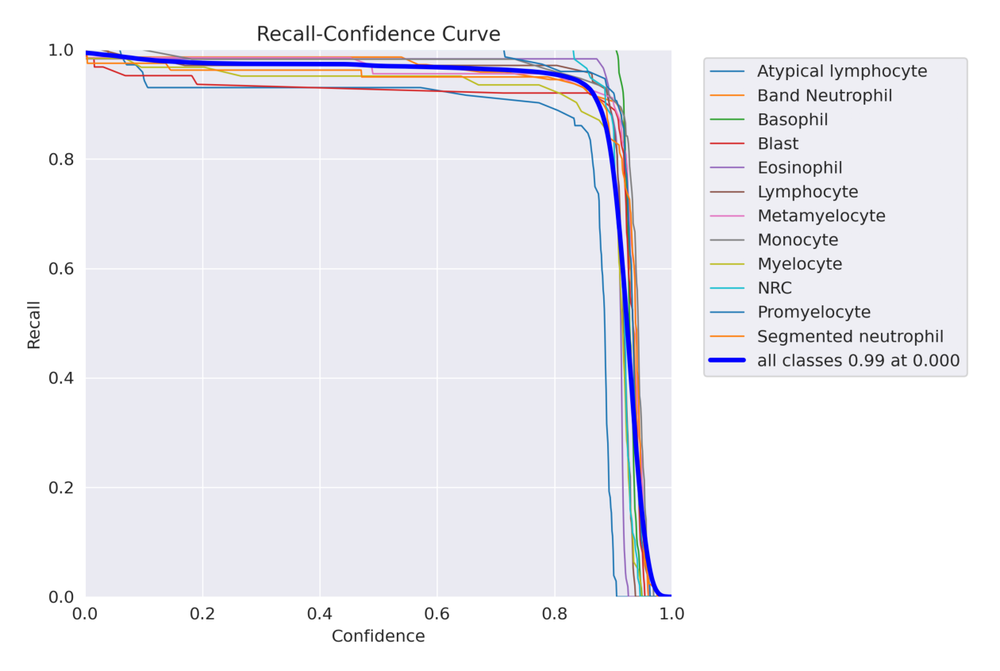

In [15]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/R_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

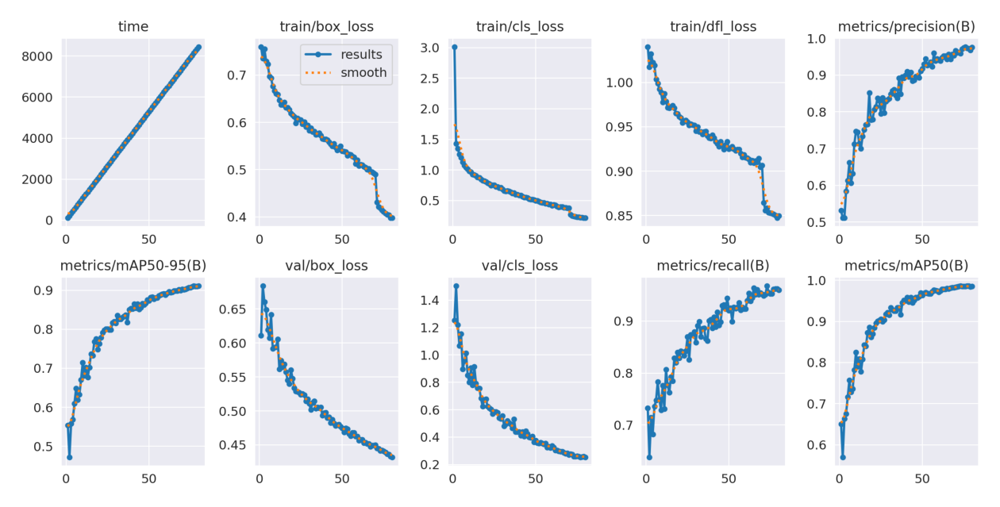

In [16]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/results.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [19]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 Atypical lymphocyte, 15.8ms
Speed: 3.7ms preprocess, 15.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Promyelocyte, 15.7ms
Speed: 2.9ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NRC, 15.7ms
Speed: 1.8ms preprocess, 15.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 15.7ms
Speed: 2.2ms preprocess, 15.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 15.7ms
Speed: 2.3ms preprocess, 15.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Myelocyte, 15.7ms
Speed: 2.3ms preprocess, 15.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 15.7ms
Speed: 3.3ms preprocess, 15.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 15.7ms
Speed: 2.8ms preprocess, 15.7ms inference, 1.3ms pos

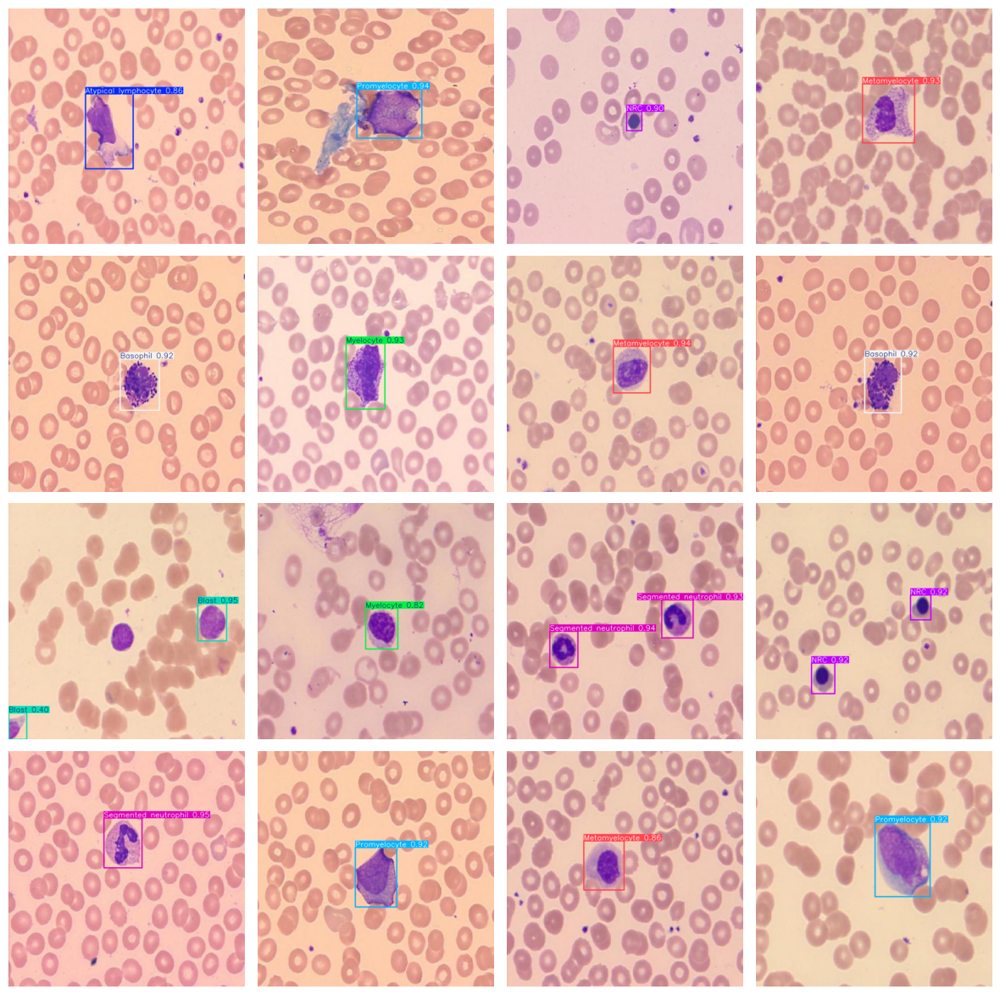

In [20]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [22]:
# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/detect/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.4,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00004_jpg.rf.33467f06547bca1934fbe5b5de747cf6.jpg: 640x640 1 Basophil, 15.7ms
image 2/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00006_jpg.rf.28e543e681b9d7532c911330ca0227b1.jpg: 640x640 1 Basophil, 16.4ms
image 3/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00010_jpg.rf.a8602ac6d9d1bff63810a82ee50fb04c.jpg: 640x640 1 Basophil, 15.7ms
image 4/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00016_jpg.rf.4ad41e92e2133917baccddeed12fc2f7.jpg: 640x640 1 Basophil, 15.7ms
image 5/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00026_jpg.rf.2a2c868b960df62918cbabd6cfcc5c24.jpg: 640x640 1 Basophil, 15.7ms
image 6/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00031_jpg.rf.9cadd0cc75ee9d59ea73a974e92e60f8.jpg: 640x640 1 Basophil, 15.7ms
image 7/667 /ka

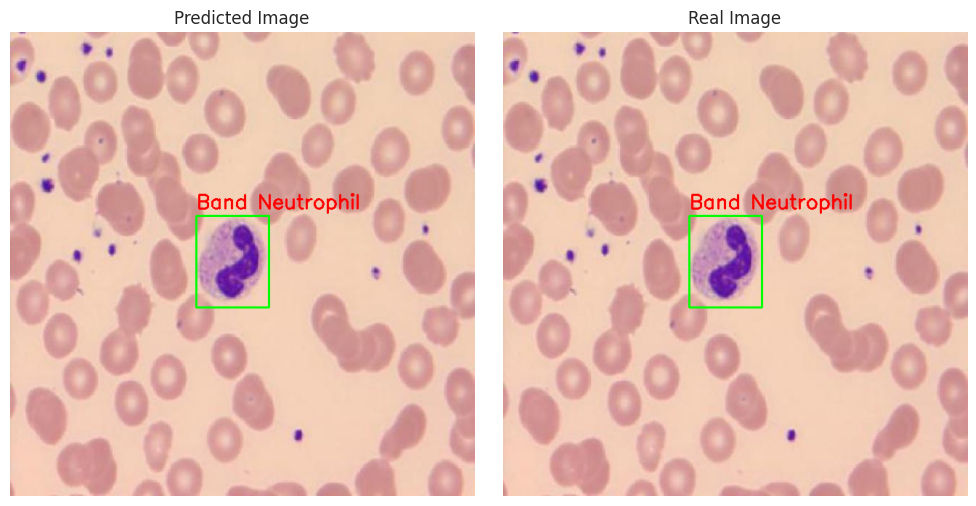

In [24]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


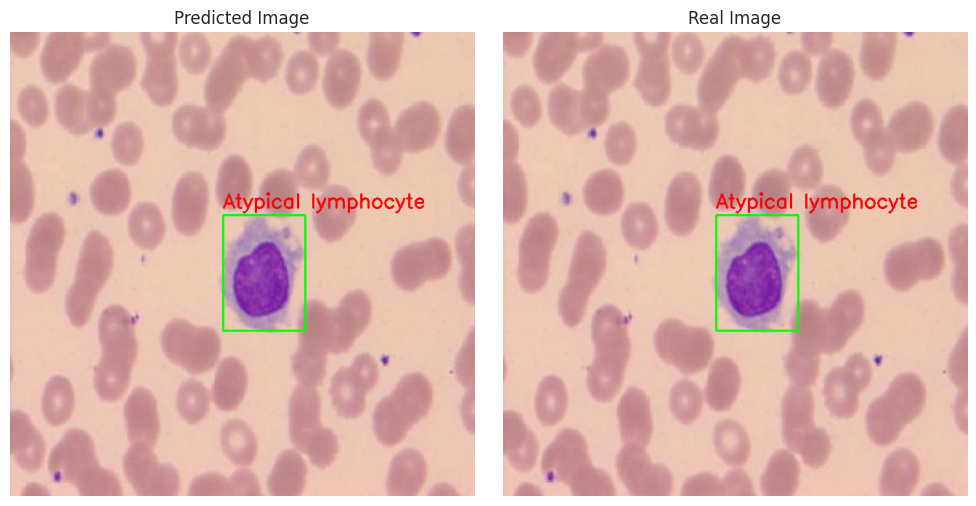

In [29]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


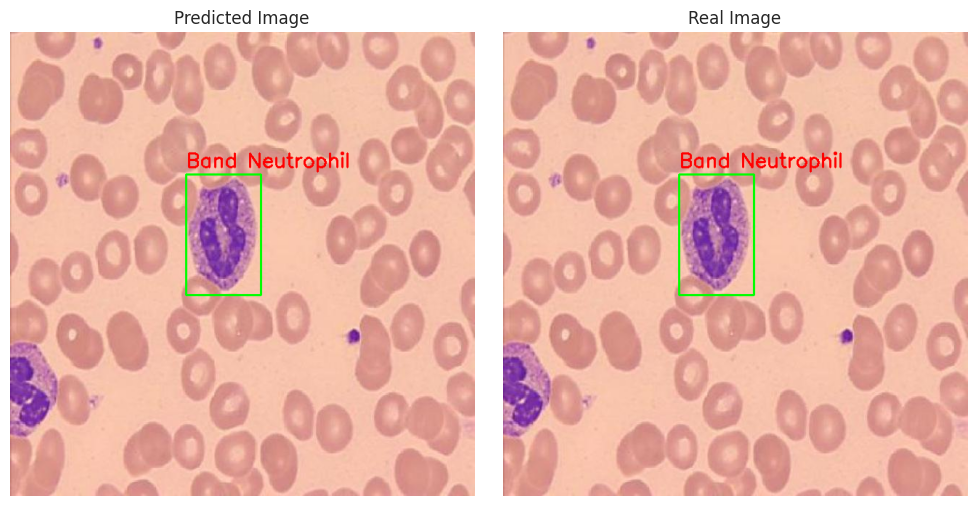

In [30]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


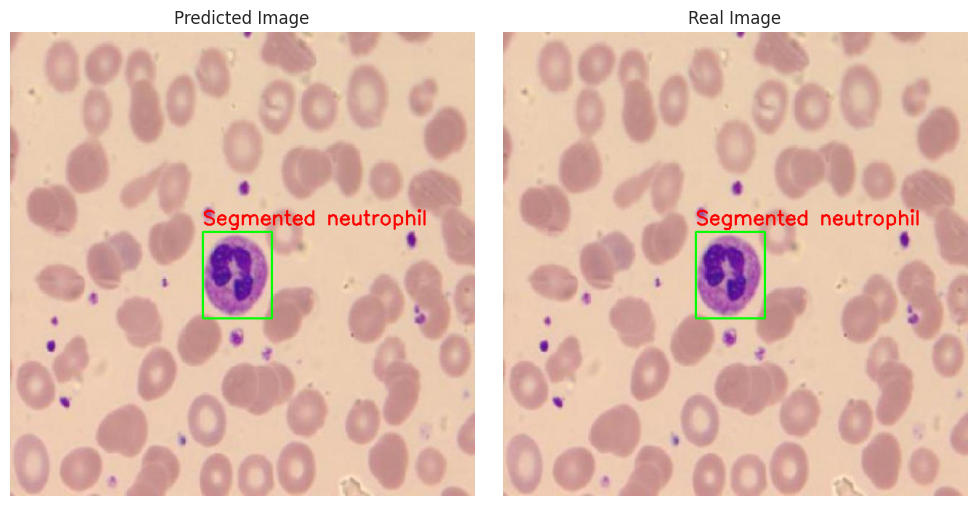

In [31]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


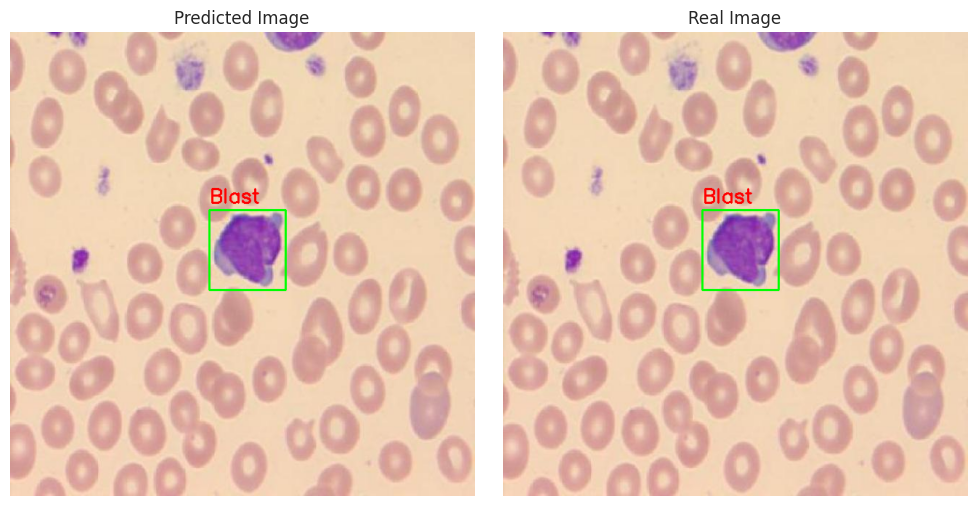

In [32]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


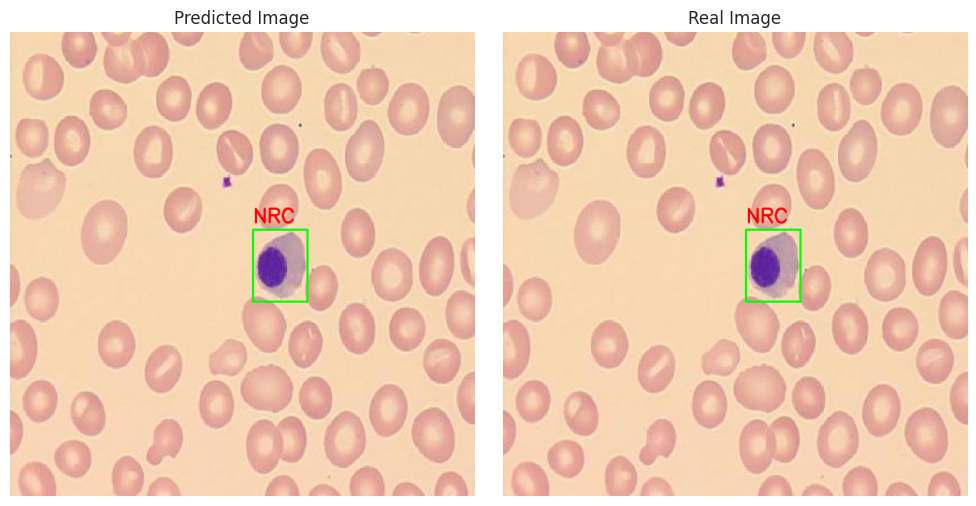

In [33]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


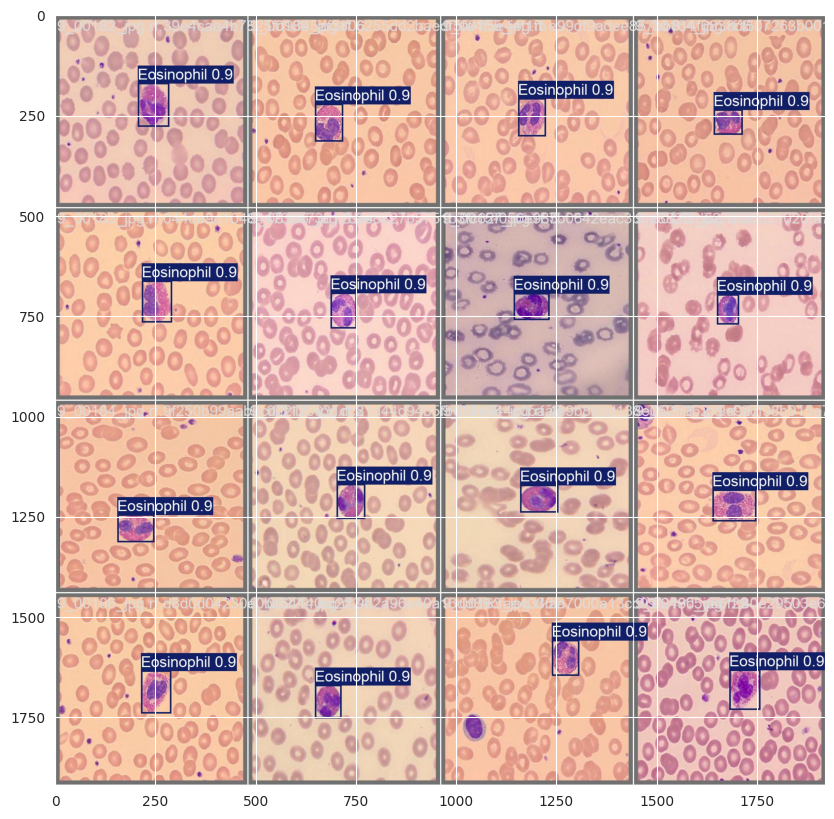

In [34]:
image_path = '/kaggle/working/runs/detect/train/val_batch0_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()

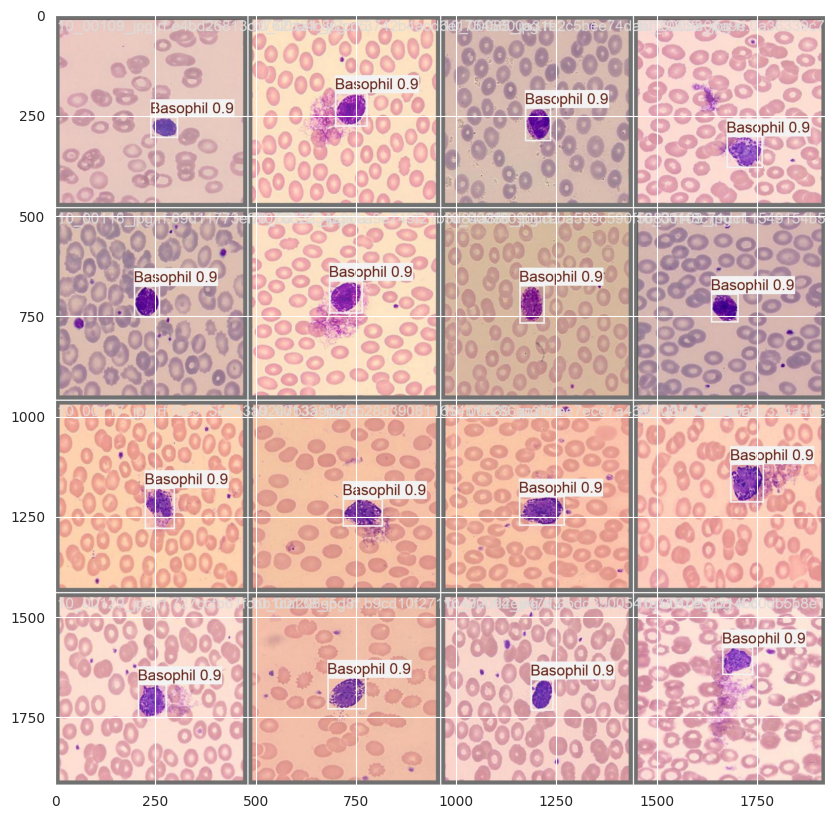

In [35]:
image_path = '/kaggle/working/runs/detect/train/val_batch1_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()